In [1]:
# Imports
import pandas as pd
import numpy as np
from pathlib import Path
import hvplot.pandas
import matplotlib.pyplot as plt
from sklearn import svm
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from pandas.tseries.offsets import DateOffset
from sklearn.metrics import classification_report
import yfinance as yf
from finta import TA
from keras.models import Sequential
from keras.layers import Dense, Activation
from sklearn.ensemble import RandomForestClassifier

2022-12-05 09:09:55.314595: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [2]:
# Download data for doge

ticker = "DOGE-USD"

doge_df = yf.download(ticker, period='2y',  index = "Date", interval = "1h")

doge_df.head()

[*********************100%***********************]  1 of 1 completed


,Open,High,Low,Close,Adj Close,Volume
2020-12-04 22:00:00,0.003359,0.003362,0.003291,0.003291,0.003291,0
2020-12-04 23:00:00,0.003292,0.003330,0.003292,0.003298,0.003298,1002360
2020-12-05 00:00:00,0.003297,0.003324,0.003268,0.003321,0.003321,1281516
2020-12-05 01:00:00,0.003321,0.003323,0.003299,0.003300,0.003300,0
2020-12-05 02:00:00,0.003300,0.003317,0.003287,0.003313,0.003313,0


### Add hourly returns column

In [3]:
# Calculate the hourly returns using the closing prices and the pct_change function
doge_df["actual_returns"] = doge_df["Close"].pct_change()

# Drop all NaN values from the DataFrame
doge_df = doge_df.dropna()

# Review the DataFrame
display(doge_df.head())
display(doge_df.tail())

,Open,High,Low,Close,Adj Close,Volume,actual_returns
2020-12-04 23:00:00,0.003292,0.003330,0.003292,0.003298,0.003298,1002360,0.001913
2020-12-05 00:00:00,0.003297,0.003324,0.003268,0.003321,0.003321,1281516,0.007039
2020-12-05 01:00:00,0.003321,0.003323,0.003299,0.003300,0.003300,0,-0.006243
2020-12-05 02:00:00,0.003300,0.003317,0.003287,0.003313,0.003313,0,0.003892
2020-12-05 03:00:00,0.003314,0.003332,0.003308,0.003328,0.003328,701800,0.004650


,Open,High,Low,Close,Adj Close,Volume,actual_returns
2022-12-04 19:00:00,0.103590,0.104063,0.103590,0.104027,0.104027,10275904,0.004451
2022-12-04 20:00:00,0.104032,0.104390,0.103975,0.104023,0.104023,19604736,-0.000037
2022-12-04 21:00:00,0.104002,0.104064,0.103810,0.103954,0.103954,1985088,-0.000659
2022-12-04 22:00:00,0.103921,0.103955,0.103801,0.103935,0.103935,1429952,-0.000190
2022-12-04 22:38:00,0.103918,0.103918,0.103918,0.103918,0.103918,0,-0.000164


### Generating trading indicators for potential use for the trading algorithm - EMA

In [4]:
# create dataframe with index & close column
ema_signals_df = doge_df.loc[:, ["Close"]].copy()

# Set the short window, middle and long windows
short_window = 10
middle_window = 40
long_window = 90

# Create a short window EMA
ema_signals_df["EMA50"] = ema_signals_df["Close"].rolling(window=short_window).mean()

# Create a middle window EMA
ema_signals_df["EMA100"] = ema_signals_df["Close"].rolling(window=middle_window).mean()

# Create a short window EMA
ema_signals_df["EMA200"] = ema_signals_df["Close"].ewm(span=long_window).mean()

# Review the DataFrame
ema_signals_df

,Close,EMA50,EMA100,EMA200
2020-12-04 23:00:00,0.003298,NaN,NaN,0.003298
2020-12-05 00:00:00,0.003321,NaN,NaN,0.003309
2020-12-05 01:00:00,0.003300,NaN,NaN,0.003306
2020-12-05 02:00:00,0.003313,NaN,NaN,0.003308
2020-12-05 03:00:00,0.003328,NaN,NaN,0.003312
...,...,...,...,...
2022-12-04 19:00:00,0.104027,0.103390,0.101902,0.101626
2022-12-04 20:00:00,0.104023,0.103404,0.101971,0.101678
2022-12-04 21:00:00,0.103954,0.103472,0.102034,0.101728
2022-12-04 22:00:00,0.103935,0.103548,0.102142,0.101777


In [5]:
# Visualize close price for the investment
price_close = ema_signals_df[["Close"]].hvplot(
    line_color='lightgray',
    ylabel='Price in $',
    width=1000,
    height=400
)

# Visualize moving averages
moving_avgs = ema_signals_df[["EMA50", "EMA100", "EMA200"]].hvplot(
    ylabel='Price in $',
    width=1000,
    height=400
)

# Overlay plots
ema_plot = price_close * moving_avgs
ema_plot

:Overlay
   .Curve.I     :Curve   [index]   (Close)
   .NdOverlay.I :NdOverlay   [Variable]
      :Curve   [index]   (value)

In [6]:
# Set the Signal column
ema_signals_df["Signal 50/100"] = 0.0
ema_signals_df["Signal 50/200"] = 0.0
ema_signals_df["Signal 100/200"] = 0.0
# Generate the trading signal 1 or 0,
# where 1 is when the EMA50 is greater than (or crosses over) the EMA100
# where 0 is when the EMA50 is under the EMA100
ema_signals_df["Signal 50/100"][short_window:] = np.where(
    ema_signals_df["EMA50"][short_window:] > ema_signals_df["EMA100"][short_window:], 1.0, 0.0
)

# where 1 is when the EMA50 is greater than (or crosses over) the EMA200
# where 0 is when the EMA50 is under the EMA200
ema_signals_df["Signal 50/200"][short_window:] = np.where(
    ema_signals_df["EMA50"][short_window:] > ema_signals_df["EMA200"][short_window:], 1.0, 0.0
)

# where 1 is when the EMA100 is greater than (or crosses over) the EMA200
# where 0 is when the EMA100 is under the EMA200
ema_signals_df["Signal 100/200"][short_window:] = np.where(
    ema_signals_df["EMA100"][short_window:] > ema_signals_df["EMA200"][short_window:], 1.0, 0.0
)

# Calculate the points in time at which a position should be taken, 1 or -1
ema_signals_df["Entry/Exit"] = (ema_signals_df["Signal 50/100"] + ema_signals_df["Signal 50/200"]+ema_signals_df["Signal 100/200"]).diff()

# Review the DataFrame
ema_signals_df.head()

,Close,EMA50,EMA100,EMA200,Signal 50/100,Signal 50/200,Signal 100/200,Entry/Exit
2020-12-04 23:00:00,0.003298,NaN,NaN,0.003298,0.0,0.0,0.0,NaN
2020-12-05 00:00:00,0.003321,NaN,NaN,0.003309,0.0,0.0,0.0,0.0
2020-12-05 01:00:00,0.003300,NaN,NaN,0.003306,0.0,0.0,0.0,0.0
2020-12-05 02:00:00,0.003313,NaN,NaN,0.003308,0.0,0.0,0.0,0.0
2020-12-05 03:00:00,0.003328,NaN,NaN,0.003312,0.0,0.0,0.0,0.0


In [7]:
# Visualize entry position relative to close price
entry = ema_signals_df[ema_signals_df["Entry/Exit"] == 1.0]["Close"].hvplot.scatter(
    color='purple',
    marker='^',
    size=200,
    legend=False,
    ylabel='Price in $',
    width=1000,
    height=400
)

# Visualize exit position relative to close price
exit = ema_signals_df[ema_signals_df["Entry/Exit"] == -1.0]["Close"].hvplot.scatter(
    color='orange',
    marker='v',
    size=200,
    legend=False,
    ylabel='Price in $',
    width=1000,
    height=400
)

# Visualize close price for the investment
security_close = ema_signals_df[["Close"]].hvplot(
    line_color='lightgray',
    ylabel='Price in $',
    width=1000,
    height=400
)

# Visualize moving averages
moving_avgs = ema_signals_df[["EMA50", "EMA100", "EMA200"]].hvplot(
    ylabel='Price in $',
    width=1000,
    height=400
)

# Overlay plots
entry_exit_plot =  price_close * moving_avgs * entry * exit
entry_exit_plot

:Overlay
   .Curve.I          :Curve   [index]   (Close)
   .NdOverlay.I      :NdOverlay   [Variable]
      :Curve   [index]   (value)
   .Scatter.Close.I  :Scatter   [index]   (Close)
   .Scatter.Close.II :Scatter   [index]   (Close)

In [8]:
# Set initial capital
initial_capital = float(100000)

# Set the coin size
position_size = 1

### Testing 3EMA indicators

In [9]:
# add total signals column to signals_df

cols = ["Signal 50/100", "Signal 50/200", "Signal 100/200"]

ema_signals_df["Total Signals"] = ema_signals_df[cols].sum(axis=1)

In [10]:
# Buy a 1 coin position when the dual ema crossover Signal equals 1
# Otherwise, `Position` should be zero (sell)
ema_signals_df['Position'] = position_size * ema_signals_df['Total Signals']

In [11]:
# Determine the points in time where a 500 coin position is bought or sold
ema_signals_df['Entry/Exit Position'] = ema_signals_df['Position'].diff()

In [12]:
# Multiply the close price by the number of coins held, or the Position
ema_signals_df['Portfolio Holdings'] = ema_signals_df['Close'] * ema_signals_df['Position']

In [13]:
# Subtract the amount of either the cost or proceeds of the trade from the initial capital invested
ema_signals_df['Portfolio Cash'] = initial_capital - (ema_signals_df['Close'] * ema_signals_df['Entry/Exit Position']).cumsum() 

In [14]:
# Calculate the total portfolio value by adding the portfolio cash to the portfolio holdings (or investments)
ema_signals_df['Portfolio Total'] = ema_signals_df['Portfolio Cash'] + ema_signals_df['Portfolio Holdings']

In [15]:
# Calculate the portfolio daily returns
ema_signals_df['Portfolio Daily Returns'] = ema_signals_df['Portfolio Total'].pct_change()

In [16]:
# Calculate the portfolio cumulative returns
ema_signals_df['Portfolio Cumulative Returns'] = (1 + ema_signals_df['Portfolio Daily Returns']).cumprod() - 1

In [17]:
# Visualize exit position relative to total portfolio value
ema_exit = ema_signals_df[ema_signals_df['Entry/Exit'] == -1.0]['Portfolio Total'].hvplot.scatter(
    color='yellow',
    marker='v',
    legend=False,
    ylabel='Total Portfolio Value',
    width=1000,
    height=400
)

# Visualize entry position relative to total portfolio value
ema_entry = ema_signals_df[ema_signals_df['Entry/Exit'] == 1.0]['Portfolio Total'].hvplot.scatter(
    color='purple',
    marker='^',
    ylabel='Total Portfolio Value',
    width=1000,
    height=400
)

# Visualize the value of the total portfolio
ema_total_portfolio_value = ema_signals_df[['Portfolio Total']].hvplot(
    line_color='lightgray',
    ylabel='Total Portfolio Value',
    xlabel='Date',
    width=1000,
    height=400
)

# Overlay the plots
ema_portfolio_entry_exit_plot = ema_total_portfolio_value * ema_entry * ema_exit
ema_portfolio_entry_exit_plot.opts(
    title="Doge Algorithm - Total Portfolio Value Using EMA Stategy",
    yformatter='%.0f'
)

:Overlay
   .Curve.I                    :Curve   [index]   (Portfolio Total)
   .Scatter.Portfolio_Total.I  :Scatter   [index]   (Portfolio Total)
   .Scatter.Portfolio_Total.II :Scatter   [index]   (Portfolio Total)

In [18]:
# Reviewing the portfolio cumulative returns
ending_portfolio_value = ema_signals_df["Portfolio Total"].iloc[-1]
total_return_dollar = round(ending_portfolio_value - initial_capital, 2)
total_return_percent = round((total_return_dollar/initial_capital)*100,2)
buy_hold_value = (initial_capital/ema_signals_df["Close"].iloc[1] * ema_signals_df["Close"].iloc[-1])

In [19]:
# Statements for the overall return of the algorithm vs buying & hold.

print(f"Starting with a ${initial_capital} investment and using a {position_size} coin position size, the overall return of this algorithm is ${total_return_dollar} or {total_return_percent}%.")
print(f"In comparison, buying and holding ${initial_capital} worth of doge over the same time period would end up with a return of ${round(buy_hold_value - initial_capital,2)} or {round((buy_hold_value - initial_capital)/initial_capital*100,2)}%.")

Starting with a $100000.0 investment and using a 1 coin position size, the overall return of this algorithm is $1.18 or 0.0%.
In comparison, buying and holding $100000.0 worth of doge over the same time period would end up with a return of $3029211.32 or 3029.21%.


### Generating trading indicators for potential use for the trading algorithm - Relative Strength Index

In [20]:
# Generate RSI
doge_rsi = TA.RSI(doge_df)  
# Join RSI with the original dataframe.
doge_df = pd.concat([doge_df, doge_rsi], axis = 1)
doge_df

,Open,High,Low,Close,Adj Close,Volume,actual_returns,14 period RSI
2020-12-04 23:00:00,0.003292,0.003330,0.003292,0.003298,0.003298,1002360,0.001913,NaN
2020-12-05 00:00:00,0.003297,0.003324,0.003268,0.003321,0.003321,1281516,0.007039,100.000000
2020-12-05 01:00:00,0.003321,0.003323,0.003299,0.003300,0.003300,0,-0.006243,50.973114
2020-12-05 02:00:00,0.003300,0.003317,0.003287,0.003313,0.003313,0,0.003892,63.056948
2020-12-05 03:00:00,0.003314,0.003332,0.003308,0.003328,0.003328,701800,0.004650,71.977676
...,...,...,...,...,...,...,...,...
2022-12-04 19:00:00,0.103590,0.104063,0.103590,0.104027,0.104027,10275904,0.004451,60.735297
2022-12-04 20:00:00,0.104032,0.104390,0.103975,0.104023,0.104023,19604736,-0.000037,60.696325
2022-12-04 21:00:00,0.104002,0.104064,0.103810,0.103954,0.103954,1985088,-0.000659,59.951671
2022-12-04 22:00:00,0.103921,0.103955,0.103801,0.103935,0.103935,1429952,-0.000190,59.724367


In [21]:
# create dataframe for RSI signals
rsi_signals_df = pd.DataFrame()
rsi_signals_df["Close"] = doge_df["Close"]

In [22]:
# Create a trading algorithm using RSI
# Set the Signal column
rsi_signals_df["Signal"] = 0.0

# Generate the trading signals 1 (entry) or -1 (exit) for a long position trading algorithm
# where 1 is when the RSI is equal to or under 25.
# where -1 is when the the RSI is equal to or greater than 80.
for index, row in doge_df.iterrows():
    if row["14 period RSI"] <= 25:
        rsi_signals_df.loc[index, "Signal"] = 1.0
    if row["14 period RSI"] >= 80:
        rsi_signals_df.loc[index,"Signal"] = -1.0

rsi_signals_df["Signal"] = rsi_signals_df["Signal"]
rsi_signals_df["Entry/Exit"] = rsi_signals_df["Signal"].diff()        
        
# Review the DataFrame
rsi_signals_df.head(10)

,Close,Signal,Entry/Exit
2020-12-04 23:00:00,0.003298,0.0,NaN
2020-12-05 00:00:00,0.003321,-1.0,-1.0
2020-12-05 01:00:00,0.003300,0.0,1.0
2020-12-05 02:00:00,0.003313,0.0,0.0
2020-12-05 03:00:00,0.003328,0.0,0.0
2020-12-05 04:00:00,0.003337,0.0,0.0
2020-12-05 05:00:00,0.003360,-1.0,-1.0
2020-12-05 06:00:00,0.003369,-1.0,0.0
2020-12-05 07:00:00,0.003367,-1.0,0.0
2020-12-05 08:00:00,0.003392,-1.0,0.0


In [23]:
# Visualize entry position relative to close price
entry = rsi_signals_df[rsi_signals_df["Entry/Exit"] == 1.0]["Close"].hvplot.scatter(
    color='green',
    marker='^',
    size=200,
    legend=False,
    ylabel='Price in $',
    width=1000,
    height=400
)

# Visualize exit position relative to close price
exit = rsi_signals_df[rsi_signals_df["Entry/Exit"] == -1.0]["Close"].hvplot.scatter(
    color='red',
    marker='v',
    size=200,
    legend=False,
    ylabel='Price in $',
    width=1000,
    height=400
)
# Visualize close price for the investment
doge_close = rsi_signals_df[["Close"]].hvplot(
    line_color='lightgray',
    ylabel='Price in $',
    width=1000,
    height=400
)


# Overlay plots
rsi_plot = doge_close * entry * exit
rsi_plot

:Overlay
   .Curve.I          :Curve   [index]   (Close)
   .Scatter.Close.I  :Scatter   [index]   (Close)
   .Scatter.Close.II :Scatter   [index]   (Close)

### Testing RSI indicators

In [24]:
# Buy a 1 coin position when the RSI is <= 25
# Otherwise, `Position` should be zero (sell)
rsi_signals_df['Position'] = position_size * rsi_signals_df['Signal']

In [25]:
# Determine the points in time where a 1 coin position is bought or sold
rsi_signals_df['Entry/Exit Position'] = rsi_signals_df['Position'].diff()

In [26]:
# Multiply the close price by the number of coins held
rsi_signals_df['Portfolio Holdings'] = rsi_signals_df['Close'] * rsi_signals_df['Position']

In [27]:
# Subtract the amount of either the cost or proceeds of the trade from the initial capital invested
rsi_signals_df['Portfolio Cash'] = initial_capital - (rsi_signals_df['Close'] * rsi_signals_df['Entry/Exit Position']).cumsum() 

In [28]:
# Calculate the total portfolio value by adding the portfolio cash to the portfolio holdings (or investments)
rsi_signals_df['Portfolio Total'] = rsi_signals_df['Portfolio Cash'] + rsi_signals_df['Portfolio Holdings']

In [29]:
# Calculate the portfolio hourly returns
rsi_signals_df['Portfolio Daily Returns'] = rsi_signals_df['Portfolio Total'].pct_change()

In [30]:
# Calculate the portfolio cumulative returns
rsi_signals_df['Portfolio Cumulative Returns'] = (1 + rsi_signals_df['Portfolio Daily Returns']).cumprod() - 1

In [31]:
# Visualize exit position relative to total portfolio value
rsi_exit = rsi_signals_df[rsi_signals_df['Entry/Exit'] == -1.0]['Portfolio Total'].hvplot.scatter(
    color='yellow',
    marker='v',
    legend=False,
    ylabel='Total Portfolio Value',
    width=1000,
    height=400
)

# Visualize entry position relative to total portfolio value
rsi_entry = rsi_signals_df[rsi_signals_df['Entry/Exit'] == 1.0]['Portfolio Total'].hvplot.scatter(
    color='purple',
    marker='^',
    ylabel='Total Portfolio Value',
    width=1000,
    height=400
)

# Visualize the value of the total portfolio
rsi_total_portfolio_value = rsi_signals_df[['Portfolio Total']].hvplot(
    line_color='lightgray',
    ylabel='Total Portfolio Value',
    xlabel='Date',
    width=1000,
    height=400
)

# Overlay the plots
rsi_portfolio_entry_exit_plot = rsi_total_portfolio_value * rsi_entry * rsi_exit
rsi_portfolio_entry_exit_plot.opts(
    title="Doge Algorithm - Total Portfolio Value Using RSI Stategy",
    yformatter='%.0f'
)

:Overlay
   .Curve.I                    :Curve   [index]   (Portfolio Total)
   .Scatter.Portfolio_Total.I  :Scatter   [index]   (Portfolio Total)
   .Scatter.Portfolio_Total.II :Scatter   [index]   (Portfolio Total)

In [32]:
# Reviewing the portfolio cumulative returns
rsi_ending_portfolio_value = rsi_signals_df["Portfolio Total"].iloc[-1]
rsi_total_return_dollar = round(rsi_ending_portfolio_value - initial_capital, 2)
rsi_total_return_percent = round((rsi_ending_portfolio_value/initial_capital)*100,2)
rsi_buy_hold_value = (initial_capital/rsi_signals_df["Close"].iloc[1] * rsi_signals_df["Close"].iloc[-1])

In [33]:
# Statements for the overall return of the algorithm vs buying & hold.

print(f"Starting with a ${initial_capital} investment and using a {position_size} coin position size, the overall return of this algorithm is ${rsi_total_return_dollar} or {rsi_total_return_percent}%.")
print(f"In comparison, buying and holding ${initial_capital} worth of doge over the same time period would end up with a return of ${round(buy_hold_value - initial_capital,2)} or {round((buy_hold_value - initial_capital)/initial_capital*100,2)}%.")

Starting with a $100000.0 investment and using a 1 coin position size, the overall return of this algorithm is $0.1 or 100.0%.
In comparison, buying and holding $100000.0 worth of doge over the same time period would end up with a return of $3029211.32 or 3029.21%.


### Generating trading indicators for potential use for the trading algorithm - Bollinger Bands

In [34]:
# Create a new clean copy of the signals_df DataFrame
bb_df = doge_df.copy()
bb_df = bb_df.rename(columns ={'Open': 'open', 'High' : 'high', 'Low' : 'low', 'Close' : 'close', 'Volume' :'volume'})

# Review the DataFrame
bb_df.head()

,open,high,low,close,Adj Close,volume,actual_returns,14 period RSI
2020-12-04 23:00:00,0.003292,0.003330,0.003292,0.003298,0.003298,1002360,0.001913,NaN
2020-12-05 00:00:00,0.003297,0.003324,0.003268,0.003321,0.003321,1281516,0.007039,100.000000
2020-12-05 01:00:00,0.003321,0.003323,0.003299,0.003300,0.003300,0,-0.006243,50.973114
2020-12-05 02:00:00,0.003300,0.003317,0.003287,0.003313,0.003313,0,0.003892,63.056948
2020-12-05 03:00:00,0.003314,0.003332,0.003308,0.003328,0.003328,701800,0.004650,71.977676


In [35]:
# Determine the Bollinger Bands for the Dataset
bb_signals_df = TA.BBANDS(bb_df)

# Concatenate the Bollinger Bands to the DataFrame
bb_signal_df = pd.concat([bb_df,bb_signals_df], axis=1)

#Create Signals
bb_signal_df["Signals"] = 0.0
trade_signal = 0
# Bollinger Bands - Generate the trading signals 1 (entry) or -1 (exit) for a long position trading algorithm 

for index, row in bb_signal_df.iterrows():
    if (row["close"] < row["BB_LOWER"]) and (trade_signal < 1):
        bb_signal_df.loc[index, "Signals"] = 1.0
        trade_signal += 1
        
    if (row["close"] > row["BB_UPPER"]) and (trade_signal > 0):
        bb_signal_df.loc[index, "Signals"] = -1.0
        trade_signal = 0
bb_signal_df.head()

,open,high,low,close,Adj Close,volume,actual_returns,14 period RSI,BB_UPPER,BB_MIDDLE,BB_LOWER,Signals
2020-12-04 23:00:00,0.003292,0.003330,0.003292,0.003298,0.003298,1002360,0.001913,NaN,NaN,NaN,NaN,0.0
2020-12-05 00:00:00,0.003297,0.003324,0.003268,0.003321,0.003321,1281516,0.007039,100.000000,NaN,NaN,NaN,0.0
2020-12-05 01:00:00,0.003321,0.003323,0.003299,0.003300,0.003300,0,-0.006243,50.973114,NaN,NaN,NaN,0.0
2020-12-05 02:00:00,0.003300,0.003317,0.003287,0.003313,0.003313,0,0.003892,63.056948,NaN,NaN,NaN,0.0
2020-12-05 03:00:00,0.003314,0.003332,0.003308,0.003328,0.003328,701800,0.004650,71.977676,NaN,NaN,NaN,0.0


In [36]:
# Visualize entry position relative to close price
doge_entry = bb_signal_df[bb_signal_df["Signals"] == 1.0]["close"].hvplot.scatter(
    color='green',
    marker='^',
    size=200,
    legend=False,
    ylabel='Price in $',
    width=1000,
    height=400
)

# Visualize exit position relative to close price
doge_exit = bb_signal_df[bb_signal_df["Signals"] == -1.0]["close"].hvplot.scatter(
    color='red',
    marker='v',
    size=200,
    legend=False,
    ylabel='Price in $',
    width=1000,
    height=400
)

# Visualize close price for the investment
doge_security_close = bb_signal_df[["close"]].hvplot(
    line_color='lightgray',
    ylabel='Price in $',
    width=1000,
    height=400
)

doge_bb_upper = bb_signal_df[["BB_UPPER"]].hvplot(
    line_color='purple',
    ylabel='Price in $',
    width=1000,
    height=400
)


doge_bb_middle = bb_signal_df[["BB_MIDDLE"]].hvplot(
    line_color='orange',
    ylabel='Price in $',
    width=1000,
    height=400
)

doge_bb_lower = bb_signal_df[["BB_LOWER"]].hvplot(
    line_color='blue',
    ylabel='Price in $',
    width=1000,
    height=400
)


doge_bbands_plot = doge_security_close * doge_bb_upper * doge_bb_middle * doge_bb_lower * doge_entry * doge_exit
doge_bbands_plot


:Overlay
   .Curve.I          :Curve   [index]   (close)
   .Curve.II         :Curve   [index]   (BB_UPPER)
   .Curve.III        :Curve   [index]   (BB_MIDDLE)
   .Curve.IV         :Curve   [index]   (BB_LOWER)
   .Scatter.Close.I  :Scatter   [index]   (close)
   .Scatter.Close.II :Scatter   [index]   (close)

### Testing Bollinger Bands indicators

In [37]:
# Buy a 1 coin position when the dual ema crossover Signal equals 1
# Otherwise, `Position` should be zero (sell)
bb_signal_df['Position'] = position_size * bb_signal_df['Signals']

In [38]:
# Determine the points in time where a 500 coin position is bought or sold
bb_signal_df['Entry/Exit Position'] = bb_signal_df['Position'].diff()

In [39]:
# Multiply the close price by the number of coins held, or the Position
bb_signal_df['Portfolio Holdings'] = bb_signal_df['close'] * bb_signal_df['Position']

In [40]:
# Subtract the amount of either the cost or proceeds of the trade from the initial capital invested
bb_signal_df['Portfolio Cash'] = initial_capital - (bb_signal_df['close'] * bb_signal_df['Entry/Exit Position']).cumsum() 

In [41]:
# Calculate the total portfolio value by adding the portfolio cash to the portfolio holdings (or investments)
bb_signal_df['Portfolio Total'] = bb_signal_df['Portfolio Cash'] + bb_signal_df['Portfolio Holdings']

In [42]:
# Calculate the portfolio daily returns
bb_signal_df['Portfolio Daily Returns'] = bb_signal_df['Portfolio Total'].pct_change()

In [43]:
# Calculate the portfolio cumulative returns
bb_signal_df['Portfolio Cumulative Returns'] = (1 + bb_signal_df['Portfolio Daily Returns']).cumprod() - 1

In [44]:
# Visualize exit position relative to total portfolio value
bb_exit = bb_signal_df[bb_signal_df['Signals'] == -1.0]['Portfolio Total'].hvplot.scatter(
    color='yellow',
    marker='v',
    legend=False,
    ylabel='Total Portfolio Value',
    width=1000,
    height=400
)

# Visualize entry position relative to total portfolio value
bb_entry = bb_signal_df[bb_signal_df['Signals'] == 1.0]['Portfolio Total'].hvplot.scatter(
    color='purple',
    marker='^',
    ylabel='Total Portfolio Value',
    width=1000,
    height=400
)

# Visualize the value of the total portfolio
bb_total_portfolio_value = bb_signal_df[['Portfolio Total']].hvplot(
    line_color='lightgray',
    ylabel='Total Portfolio Value',
    xlabel='Date',
    width=1000,
    height=400
)

# Overlay the plots
bb_portfolio_entry_exit_plot = bb_total_portfolio_value * bb_entry * bb_exit
bb_portfolio_entry_exit_plot.opts(
    title="doge Algorithm - Total Portfolio Value Using BB Stategy",
    yformatter='%.0f'
)

:Overlay
   .Curve.I                    :Curve   [index]   (Portfolio Total)
   .Scatter.Portfolio_Total.I  :Scatter   [index]   (Portfolio Total)
   .Scatter.Portfolio_Total.II :Scatter   [index]   (Portfolio Total)

In [45]:
# Reviewing the portfolio cumulative returns
bb_ending_portfolio_value = bb_signal_df["Portfolio Total"].iloc[-1]
bb_total_return_dollar = round(bb_ending_portfolio_value - initial_capital, 2)
bb_total_return_percent = round((bb_ending_portfolio_value/initial_capital)*100,2)
bb_buy_hold_value = (initial_capital/bb_signal_df["close"].iloc[1] * bb_signal_df["close"].iloc[-1])

In [46]:
# Statements for the overall return of the algorithm vs buying & hold.

print(f"Starting with a ${initial_capital} investment and using a {position_size} coin position size, the overall return of this algorithm is ${bb_total_return_dollar} or {bb_total_return_percent}%.")
print(f"In comparison, buying and holding ${initial_capital} worth of Doge over the same time period would end up with a return of ${round(buy_hold_value - initial_capital,2)} or {round((buy_hold_value - initial_capital)/initial_capital*100,2)}%.")

Starting with a $100000.0 investment and using a 1 coin position size, the overall return of this algorithm is $-0.12 or 100.0%.
In comparison, buying and holding $100000.0 worth of Doge over the same time period would end up with a return of $3029211.32 or 3029.21%.


### Machine Learning - Create feature set


In [47]:
# Assign above features to a new DataFrame called X
X = doge_df[["14 period RSI", "Close", "Volume"]].copy()

X = X.dropna()

# Display sample data
display(X.head())

,14 period RSI,Close,Volume
2020-12-05 00:00:00,100.000000,0.003321,1281516
2020-12-05 01:00:00,50.973114,0.003300,0
2020-12-05 02:00:00,63.056948,0.003313,0
2020-12-05 03:00:00,71.977676,0.003328,701800
2020-12-05 04:00:00,75.447069,0.003337,0


### Split the Data Into Training and Testing Datasets

In [48]:
# Copy the new signal column to a new Series called y.
y = rsi_signals_df["Signal"].copy()

In [49]:
# Select the start of the training period
training_begin = X.index.min()

# Display the training begin date
print(training_begin)

2020-12-05 00:00:00


In [50]:
# Select the ending period for the training data with an offset of 18 months
training_end = X.index.min() + DateOffset(months=6)

# Display the training end date
print(training_end)

2021-06-05 00:00:00


In [51]:
# Generate the X_train and y_train DataFrames
X_train = X.loc[training_begin:training_end]
y_train = y.loc[training_begin:training_end]

# Display sample data
X_train.head()

,14 period RSI,Close,Volume
2020-12-05 00:00:00,100.000000,0.003321,1281516
2020-12-05 01:00:00,50.973114,0.003300,0
2020-12-05 02:00:00,63.056948,0.003313,0
2020-12-05 03:00:00,71.977676,0.003328,701800
2020-12-05 04:00:00,75.447069,0.003337,0


In [52]:
# Generate the X_test and y_test DataFrames
X_test = X.loc[training_end:]
y_test = y.loc[training_end:]

# Display sample data
X_test.tail()

,14 period RSI,Close,Volume
2022-12-04 19:00:00,60.735297,0.104027,10275904
2022-12-04 20:00:00,60.696325,0.104023,19604736
2022-12-04 21:00:00,59.951671,0.103954,1985088
2022-12-04 22:00:00,59.724367,0.103935,1429952
2022-12-04 22:38:00,59.514819,0.103918,0


### Standardizing the Data

In [53]:
# Create a StandardScaler instance
scaler = StandardScaler()
 
# Apply the scaler model to fit the X-train data
X_scaler = scaler.fit(X_train)
 
# Transform the X_train and X_test DataFrames using the X_scaler
X_train_scaled = X_scaler.transform(X_train)
X_test_scaled = X_scaler.transform(X_test)

### Incorporate the SVM Machine Learning Into the Trading Strategy

In [54]:
# Create the classifier model
svm_model = svm.SVC()
 
# Fit the model to the data using X_train_scaled and y_train
svm_model = svm_model.fit(X_train_scaled, y_train)

# Use the trained model to predict the trading signals for the training data
training_signal_predictions = svm_model.predict(X_train_scaled)

# Display the sample predictions
training_signal_predictions[:10]

array([-1.,  0.,  0.,  0.,  0., -1., -1., -1., -1.,  0.])

In [55]:
# Evaluate the model using a classification report
training_report = classification_report(y_train, training_signal_predictions)
print(training_report)

              precision    recall  f1-score   support

        -1.0       0.96      0.99      0.97        93
         0.0       1.00      1.00      1.00      4174
         1.0       1.00      0.78      0.88        36

    accuracy                           1.00      4303
   macro avg       0.99      0.92      0.95      4303
weighted avg       1.00      1.00      1.00      4303



### Backtesting a Machine Learning Trading Algorithm

In [56]:
# Use the trained model to predict the trading signals for the testing data.
testing_signal_predictions = svm_model.predict(X_test_scaled)
# Evaluate the model's ability to predict the trading signal for the testing data
svm_testing_report = classification_report(y_test, testing_signal_predictions)
print(svm_testing_report)

              precision    recall  f1-score   support

        -1.0       0.96      0.96      0.96        76
         0.0       0.99      1.00      1.00     12592
         1.0       1.00      0.72      0.84       328

    accuracy                           0.99     12996
   macro avg       0.98      0.89      0.93     12996
weighted avg       0.99      0.99      0.99     12996



In [57]:
# Create a new empty predictions DataFrame using code provided below.
predictions_df = pd.DataFrame(index=X_test.index)
predictions_df["predicted_signal"] = testing_signal_predictions
predictions_df["actual_returns"] = doge_df["actual_returns"]
predictions_df["trading_algorithm_returns"] = predictions_df["actual_returns"] * predictions_df["predicted_signal"]
predictions_df.head(10)

,predicted_signal,actual_returns,trading_algorithm_returns
2021-06-05 00:00:00,0.0,0.002577,0.0
2021-06-05 01:00:00,0.0,0.001994,0.0
2021-06-05 02:00:00,0.0,-0.000786,-0.0
2021-06-05 03:00:00,0.0,-0.015828,-0.0
2021-06-05 04:00:00,0.0,0.013544,0.0
2021-06-05 05:00:00,0.0,-0.004090,-0.0
2021-06-05 06:00:00,0.0,0.010895,0.0
2021-06-05 07:00:00,0.0,-0.004403,-0.0
2021-06-05 08:00:00,0.0,0.013745,0.0
2021-06-05 09:00:00,0.0,-0.037378,-0.0


<AxesSubplot:title={'center':'SVM Trading Algorithm'}>

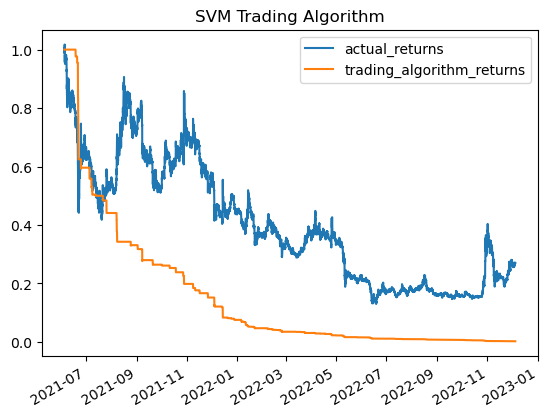

In [58]:
# Calculate and plot the cumulative returns for the `actual_returns` and the `trading_algorithm_returns`
(1 + predictions_df[["actual_returns", "trading_algorithm_returns"]]).cumprod().plot(title = "SVM Trading Algorithm")

### Add a Logistic Regression Model

In [59]:
# Create an instance of the LogisticRegression model
logistic_regression_model = LogisticRegression()

In [60]:
# Fit the LogisticRegression model
logistic_regression_model.fit(X_train_scaled, y_train)

LogisticRegression()

In [61]:
# Use the trained LogisticRegression model to predict the trading signals for the training data
lr_training_signal_predictions = logistic_regression_model.predict(X_train_scaled)

# Display the predictions
lr_training_signal_predictions

array([-1.,  0.,  0., ...,  0.,  0.,  0.])

In [62]:
# Generate a classification report using the training data and the logistic regression model's predications
lr_training_report = classification_report(y_train, lr_training_signal_predictions)

# Review the classification report
print(lr_training_report)

              precision    recall  f1-score   support

        -1.0       1.00      0.98      0.99        93
         0.0       1.00      1.00      1.00      4174
         1.0       1.00      0.67      0.80        36

    accuracy                           1.00      4303
   macro avg       1.00      0.88      0.93      4303
weighted avg       1.00      1.00      1.00      4303



In [63]:
# Use the trained model to predict the trading signals for the testing data.
lr_testing_signal_predictions = logistic_regression_model.predict(X_test_scaled)

In [64]:
# Generate a classification report using the testing data and the logistic regression model's predictions
lr_testing_report = classification_report(y_test, lr_testing_signal_predictions)

# Review the testing classification report
print(lr_testing_report)

              precision    recall  f1-score   support

        -1.0       1.00      0.91      0.95        76
         0.0       0.99      1.00      1.00     12592
         1.0       1.00      0.77      0.87       328

    accuracy                           0.99     12996
   macro avg       1.00      0.89      0.94     12996
weighted avg       0.99      0.99      0.99     12996



In [65]:
# Create a new empty predictions DataFrame using code provided below.
lr_predictions_df = pd.DataFrame(index=X_test.index)
lr_predictions_df["predicted_signal"] = lr_testing_signal_predictions
lr_predictions_df["actual_returns"] = doge_df["actual_returns"]
lr_predictions_df["trading_algorithm_returns"] = lr_predictions_df["actual_returns"] * lr_predictions_df["predicted_signal"]
lr_predictions_df.head()

,predicted_signal,actual_returns,trading_algorithm_returns
2021-06-05 00:00:00,0.0,0.002577,0.0
2021-06-05 01:00:00,0.0,0.001994,0.0
2021-06-05 02:00:00,0.0,-0.000786,-0.0
2021-06-05 03:00:00,0.0,-0.015828,-0.0
2021-06-05 04:00:00,0.0,0.013544,0.0


<AxesSubplot:title={'center':'Logistic Regression Trading Algorithm'}>

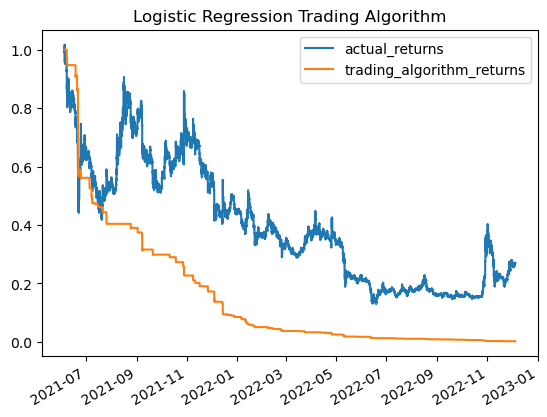

In [66]:
# Calculate and plot the cumulative returns for the `actual_returns` and the `trading_algorithm_returns`
(1 + lr_predictions_df[["actual_returns", "trading_algorithm_returns"]]).cumprod().plot(title = "Logistic Regression Trading Algorithm")

### Add a Logistic Regression Model

In [67]:
#Creating the RandomForestClassifer instance
rf_model = RandomForestClassifier(random_state=1)

# Fit the training data to the model
rf_model = rf_model.fit(X_train_scaled, y_train)

# Predict labels for original scaled testing features
rf_pred = rf_model.predict(X_test_scaled)

In [68]:
# Generate a classification report using the training data and the RandomForestClassifier model's predications
rf_testing_report = classification_report(y_test, rf_pred)

In [69]:
# Print the classification report for the RandomForestClassifier model using the test data
print("RandomForestClassifier Classification Report")
print(rf_testing_report)

RandomForestClassifier Classification Report
              precision    recall  f1-score   support

        -1.0       1.00      1.00      1.00        76
         0.0       1.00      1.00      1.00     12592
         1.0       1.00      1.00      1.00       328

    accuracy                           1.00     12996
   macro avg       1.00      1.00      1.00     12996
weighted avg       1.00      1.00      1.00     12996



In [70]:
# Create a new empty predictions DataFrame using code provided below.
rf_predictions_df = pd.DataFrame(index=X_test.index)
rf_predictions_df["predicted_signal"] = rf_pred
rf_predictions_df["actual_returns"] = doge_df["actual_returns"]
rf_predictions_df["rf_algorithm_returns"] = rf_predictions_df["actual_returns"] * rf_predictions_df["predicted_signal"]

<AxesSubplot:title={'center':'RandomForestClassifier Trading Algorithm'}>

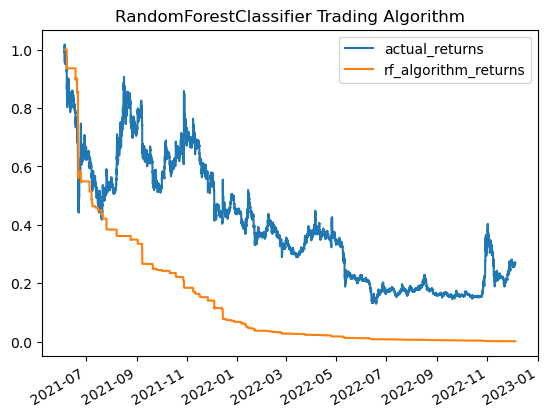

In [71]:
#Plotting the RandomForestClassifier returns compared to the actual returns
(1 + rf_predictions_df[["actual_returns", "rf_algorithm_returns"]]).cumprod().plot(title = "RandomForestClassifier Trading Algorithm")

## Compare the performance of the SVM, Logistic Regression, and RandomForestClassifier  using the classification reports generated with the testing data. 

In [72]:
# Print the classification report for the SVM model using the test data
print("SVM Classification Report")
print(svm_testing_report)

SVM Classification Report
              precision    recall  f1-score   support

        -1.0       0.96      0.96      0.96        76
         0.0       0.99      1.00      1.00     12592
         1.0       1.00      0.72      0.84       328

    accuracy                           0.99     12996
   macro avg       0.98      0.89      0.93     12996
weighted avg       0.99      0.99      0.99     12996



In [73]:
# Print the classification report for the Logistic Regression model using the test data
print("Logistic Regression Classification Report")
print(lr_testing_report)


Logistic Regression Classification Report
              precision    recall  f1-score   support

        -1.0       1.00      0.91      0.95        76
         0.0       0.99      1.00      1.00     12592
         1.0       1.00      0.77      0.87       328

    accuracy                           0.99     12996
   macro avg       1.00      0.89      0.94     12996
weighted avg       0.99      0.99      0.99     12996



In [74]:
# Print the classification report for the RandomForestClassifier model using the test data
print("RandomForestClassifier Classification Report")
print(rf_testing_report)

RandomForestClassifier Classification Report
              precision    recall  f1-score   support

        -1.0       1.00      1.00      1.00        76
         0.0       1.00      1.00      1.00     12592
         1.0       1.00      1.00      1.00       328

    accuracy                           1.00     12996
   macro avg       1.00      1.00      1.00     12996
weighted avg       1.00      1.00      1.00     12996



## Predicting Signals with Neural Network



In [75]:
#Defining the number of inputs for the model
number_inputs = 3

#Define the number of nodes for the first hidden layer
hidden_nodes_layer1 = 10

#Define the number of nodes for the second hidden layer
hidden_nodes_layer2 = 8

In [76]:
#Initialising the Sequential model
nn_model = Sequential()

2022-12-05 09:10:07.341155: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [77]:
# Add the first Dense layer specifying the number of inputs, the number of hidden nodes, and the activation function
nn_model.add(
    Dense(units=hidden_nodes_layer1, input_dim=number_inputs, activation="relu")
)

# Add the second Dense layer specifying the number of hidden nodes and the activation function
nn_model.add(
    Dense(units=hidden_nodes_layer2, activation="relu")
)

# Add the output layer to the model specifying the number of output neurons and activation function
nn_model.add(Dense(units=1, activation="sigmoid"))

In [78]:
# Display the Sequential model summary
nn_model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 10)                40        
                                                                 
 dense_1 (Dense)             (None, 8)                 88        
                                                                 
 dense_2 (Dense)             (None, 1)                 9         
                                                                 
Total params: 137
Trainable params: 137
Non-trainable params: 0
_________________________________________________________________


In [79]:
# Compile the Sequential model
nn_model.compile(loss="binary_crossentropy", optimizer="adam", metrics=["accuracy"])

In [80]:
# Fit the model using 100 epochs and the training data
nn_model.fit(X_train_scaled, y_train, epochs=100)

Epoch 1/100
135/135 [==============================] - 1s 1ms/step - loss: 0.2985 - accuracy: 0.9693
Epoch 2/100
135/135 [==============================] - 0s 1ms/step - loss: -0.1235 - accuracy: 0.9700
Epoch 3/100
135/135 [==============================] - 0s 1ms/step - loss: -0.4454 - accuracy: 0.9700
Epoch 4/100
135/135 [==============================] - 0s 1ms/step - loss: -0.9908 - accuracy: 0.9700
Epoch 5/100
135/135 [==============================] - 0s 1ms/step - loss: -1.9472 - accuracy: 0.9700
Epoch 6/100
135/135 [==============================] - 0s 1ms/step - loss: -3.4693 - accuracy: 0.9700
Epoch 7/100
135/135 [==============================] - 0s 991us/step - loss: -5.6677 - accuracy: 0.9700
Epoch 8/100
135/135 [==============================] - 0s 972us/step - loss: -8.7119 - accuracy: 0.9700
Epoch 9/100
135/135 [==============================] - 0s 1ms/step - loss: -12.6293 - accuracy: 0.9700
Epoch 10/100
135/135 [==============================] - 0s 997us/step - loss: 

In [81]:
# Evaluate the model loss and accuracy metrics using the evaluate method and the test data
model_loss, model_accuracy = nn_model.evaluate(X_test_scaled, y_test, verbose=2)

# Display the evaluation results
print(f"Loss: {model_loss}, Accuracy: {model_accuracy}")

407/407 - 0s - loss: -1.6966e+03 - accuracy: 0.9922 - 364ms/epoch - 895us/step
Loss: -1696.5943603515625, Accuracy: 0.9922283887863159


In [82]:
nn_pred = nn_model.predict(X_test_scaled)
nn_pred

407/407 [==============================] - 0s 654us/step


array([[0.],
       [0.],
       [0.],
       ...,
       [0.],
       [0.],
       [0.]], dtype=float32)

In [83]:
nn_predictions_df = pd.DataFrame(index=X_test.index)
nn_predictions_df["predicted_signal"] = nn_pred
nn_predictions_df["actual_returns"] = doge_df["actual_returns"]
nn_predictions_df["neural_network_algorithm_returns"] = nn_predictions_df["actual_returns"] * nn_predictions_df["predicted_signal"]

<AxesSubplot:title={'center':'Neural Network Trading Algorithm'}>

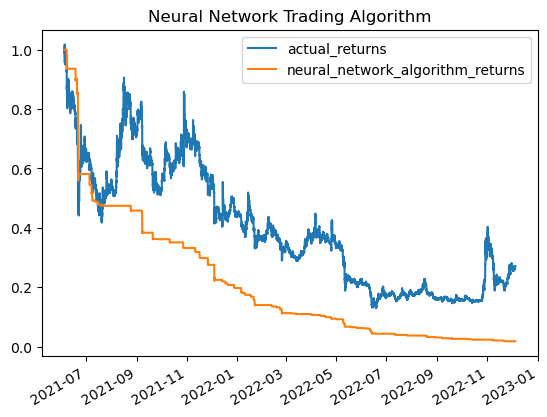

In [84]:
(1 + nn_predictions_df[["actual_returns", "neural_network_algorithm_returns"]]).cumprod().plot(title = "Neural Network Trading Algorithm")